In [3]:
import os
import pickle
from itertools import combinations
import numpy as np
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
import torch, gc
from PIL import Image
import matplotlib.pyplot as plt
from models import Unet, get_default_device, to_device, DeviceDataLoader
import pandas as pd



In [4]:
rectype=['L2','L1','TV']
rectype_combinations=[] 
rectype_strings=[]
for i in range(len(rectype)):
    for p in combinations(rectype, i+1):  # 2 for pairs, 3 for triplets, etc
        rectype_combinations.append(p)
        rectype_strings.append('_'.join(p))
rectype_combinations
rectype_strings

radial_lines=[20,40,60,80,100]
dataset_dir='./BIRN_dataset/'
images_dir=(dataset_dir+'birn_png/')
rec_dirs=[(f"{dataset_dir}birn_pngs_{rl}lines_{rt}/") for rt in rectype for rl in radial_lines]
rec_dirs


['./BIRN_dataset/birn_pngs_20lines_L2/',
 './BIRN_dataset/birn_pngs_40lines_L2/',
 './BIRN_dataset/birn_pngs_60lines_L2/',
 './BIRN_dataset/birn_pngs_80lines_L2/',
 './BIRN_dataset/birn_pngs_100lines_L2/',
 './BIRN_dataset/birn_pngs_20lines_L1/',
 './BIRN_dataset/birn_pngs_40lines_L1/',
 './BIRN_dataset/birn_pngs_60lines_L1/',
 './BIRN_dataset/birn_pngs_80lines_L1/',
 './BIRN_dataset/birn_pngs_100lines_L1/',
 './BIRN_dataset/birn_pngs_20lines_TV/',
 './BIRN_dataset/birn_pngs_40lines_TV/',
 './BIRN_dataset/birn_pngs_60lines_TV/',
 './BIRN_dataset/birn_pngs_80lines_TV/',
 './BIRN_dataset/birn_pngs_100lines_TV/']

In [5]:

idx_file='indexes.pkl'
if not os.path.exists(idx_file):
    np.random.seed(seed=42)
    all_indexes=np.random.permutation(len([f for f in os.listdir(images_dir) if f.endswith('.png')]))
    m = len(all_indexes)
    m_train=int(m*0.8)
    m_val = int(m*0.1)
    train_indexes=all_indexes[:m_train]
    val_indexes=all_indexes[m_train:m_train+m_val]
    test_indexes=all_indexes[m_train+m_val:]
    
    with open(idx_file, 'wb') as f:  # Python 3: open(..., 'wb')
        pickle.dump([train_indexes, val_indexes, test_indexes], f)
else:
    with open(idx_file,'rb') as f:  # Python 3: open(..., 'rb')
        train_indexes, val_indexes, test_indexes = pickle.load(f)

In [6]:

class OriginalReconstructionDataset(Dataset):
    def __init__(self, radial_line, rec_type_str, datasets_dir, indexes = None, img_size=(256,256)):
        rectype=['L2','L1','TV']
        rectype_combinations=[] 
        rectype_strings=[]
        for i in range(len(rectype)):
            for p in combinations(rectype, i+1):  # 2 for pairs, 3 for triplets, etc
                rectype_combinations.append(p)
                rectype_strings.append('_'.join(p))
        self.rectype_strings=rectype_strings
        
        self.radial_lines=[20,40,60,80,100]

        rec_type=rec_type_str.split('_')

        self.images_dir=(dataset_dir+'birn_png/')
        rec_dirs=[(f"{dataset_dir}birn_pngs_{rl}lines_{rt}/") for rt in self.rectype_strings for rl in self.radial_lines]
        self.rec_images_dirs=[]
        for dir in rec_dirs:
            for rt in rec_type:
                if rt in dir:
                    if str(radial_line) in dir:
                        self.rec_images_dirs.append(dir)
                        break

        self.images = [f for f in os.listdir(self.images_dir) if f.endswith('.png')]
        if indexes is not None:
            self.images = [self.images[i] for i in indexes] 
        self.transform = transforms.Compose([
                        transforms.Grayscale(num_output_channels=1),         
                        transforms.Resize(img_size),
                        #transforms.Lambda(lambda x: x/255.0),
                        transforms.ToTensor()
                        ])

        self.rec_types=rec_type
        self.radial_line=radial_line

    def __len__(self):
    # return length of image samples    
        return len(self.images)

    def __getitem__(self, idx):
        img_name=self.images[idx]
        img = Image.open(self.images_dir+img_name)
        img=self.transform(img)
        rec_imgs=[]
        for rec,dir in zip(self.rec_types,self.rec_images_dirs):
            noisy_name=img_name[:-14]+rec+f'_{self.radial_line}lines.png'            
            tensor=self.transform(Image.open(dir+noisy_name))
            rec_imgs.append(tensor)

        
        noisy=torch.stack(rec_imgs)
        noisy=torch.squeeze(noisy, 1)
        return (img,noisy)

def first_element(test_dataset):
    for data in test_dataset:
        print(data[0].shape)
        print(data[1].shape)
        break


In [7]:
batch_size=4
device='cpu'#get_default_device()

def get_dataloader(rad_lines, rectype, num_imgs='all',batch_size=batch_size, device=device):
    if num_imgs=='all':
        test_ds=OriginalReconstructionDataset(rad_lines, rectype, dataset_dir, test_indexes)
    else:
        test_ds=OriginalReconstructionDataset(rad_lines, rectype, dataset_dir, test_indexes[:num_imgs])
    first_element(test_ds)
    return DeviceDataLoader(torch.utils.data.DataLoader(test_ds, batch_size=batch_size,shuffle=True), device)
           

In [8]:
def test_dataloader(model, device, dataloader, loss_fn = torch.nn.MSELoss()):
    # Set evaluation mode
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_orig = []
        conc_recs = []
        for image_batch, image_noisy in dataloader:
            print(image_batch.shape, image_noisy.shape)

            result = model(image_noisy)
            # Append the network output and the original image to the lists
            conc_out.append(result.cpu())
            conc_recs.append(image_noisy.cpu())
            conc_orig.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_recs = torch.cat(conc_recs)        
        conc_orig = torch.cat(conc_orig) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_orig)
    return conc_out, conc_recs, conc_orig, val_loss.data

In [9]:
def load_model(model_name, radial_lines, rectype, device='cuda:0', max_epochs=500, plot=True):
    assert isinstance(radial_lines, int)
    models_path='saved_models/'
    model_dir=[models_path+d for d in os.listdir(models_path) if model_name in d and str(radial_lines) in d and d.endswith('lines_'+rectype)][0]
    model_csv=model_dir+'/loss_history.csv'
    print(model_dir)


    if not os.path.exists(model_csv):
        error('csv file not found')
    
    df_history=pd.read_csv(model_csv)
    df_history = df_history.loc[:, ~df_history.columns.str.contains('^Unnamed')]
    df_history=df_history.drop_duplicates(subset=['epoch'], keep='first')

    if len(df_history)<max_epochs:
        error('Training not finished')

    
    #find best model (lowest validation loss)
    val_sorted_df=df_history.sort_values(by=['val_loss'])
    for i, row in val_sorted_df.iterrows():
        if os.path.isfile(row['checkpoint']):
            best_epoch=row['epoch']
            best_checkpoint=row['checkpoint']
            best_checkpoint=best_checkpoint.replace('//','/')
            break
    
    if plot:
        plt.figure(figsize=(6, 18), dpi=200)
        plt.plot(df_history['train_loss'])
        plt.plot(df_history['val_loss'])
        plt.legend(['train loss','validation loss'])
        plt.yscale('log')
        plt.title(f'{model_name} model losses, {radial_lines} radial lines, {rectype} reconstruction')
        plt.show()

    if model_name=='Unet':
        model=Unet(num_inputs=len(rectype.split('_'))) #1 a 3 canais
    elif model_name=='Uformer':
        pass
        #IF TO ADD NEW MODEL IMPLEMENT H#RE
    else:
        error('Model not found...')
    
    params_to_optimize = [{'params': model.parameters()}]        

    checkpoint = torch.load(best_checkpoint, map_location=torch.device(device))
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    #scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    epoch = checkpoint['epoch']
    train_loss = checkpoint['train_loss']
    val_loss = checkpoint['val_loss']
    #model.to(device)
    #optimizer_to(optimizer,device)
    return (model, epoch, train_loss, val_loss)


cpu
saved_models/Unet_20lines_L2_L1_TV


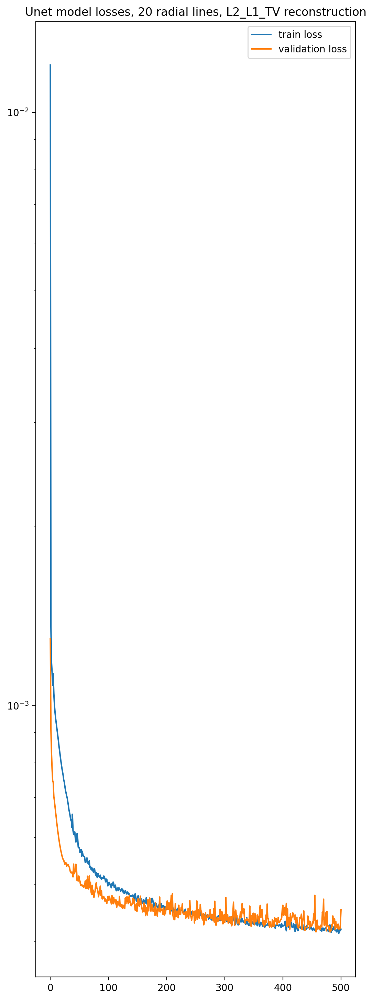

In [10]:
print(device)
model_name='Unet'
rad_lines=20
rectype='L2_L1_TV'
model, epoch, train_loss, val_loss= load_model(model_name=model_name, radial_lines=rad_lines, rectype=rectype, device=device)

In [226]:
dataloader=get_dataloader(rad_lines=rad_lines, rectype=rectype, num_imgs=10)
rec_imgs, input_imgs, orig_imgs, val_loss=test_dataloader(model, device, dataloader, loss_fn = torch.nn.MSELoss())

torch.Size([1, 256, 256])
torch.Size([3, 256, 256])
torch.Size([4, 1, 256, 256]) torch.Size([4, 3, 256, 256])
torch.Size([4, 1, 256, 256]) torch.Size([4, 3, 256, 256])
torch.Size([2, 1, 256, 256]) torch.Size([2, 3, 256, 256])


torch.Size([10, 1, 256, 256]) torch.Size([10, 3, 256, 256]) torch.Size([10, 1, 256, 256])


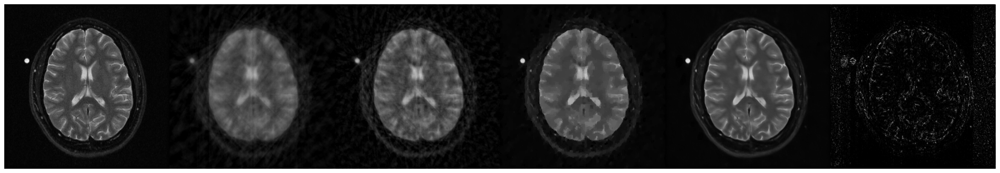

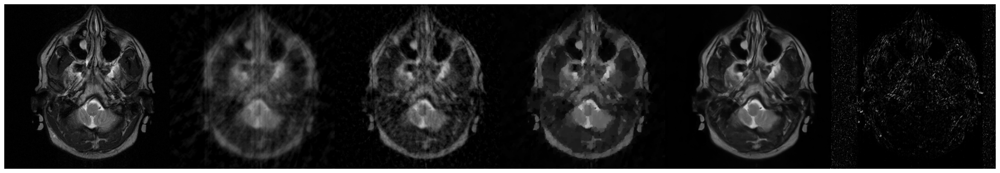

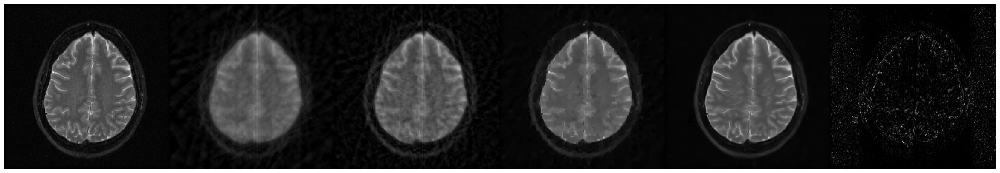

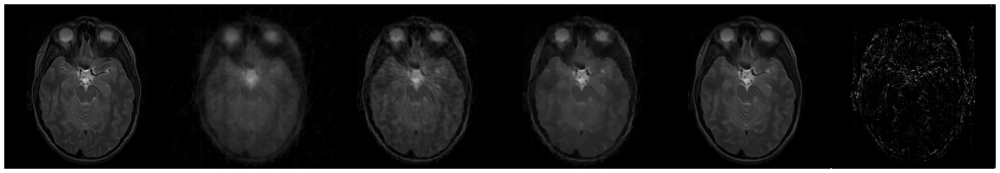

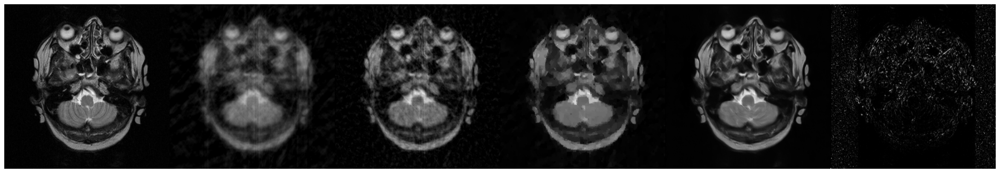

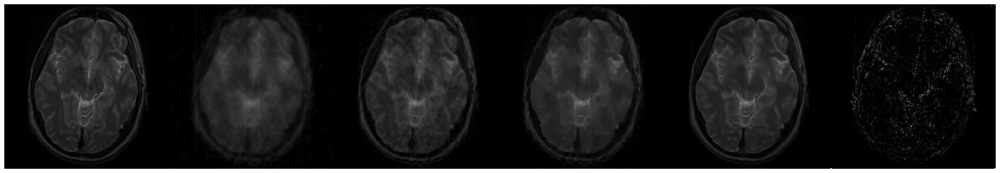

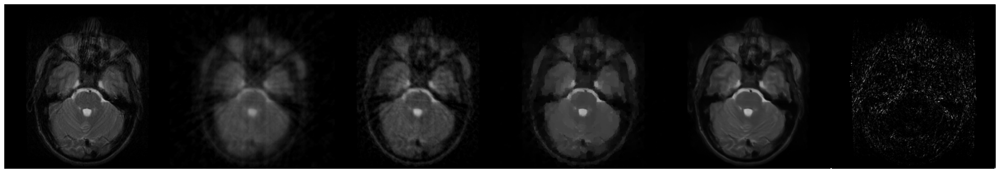

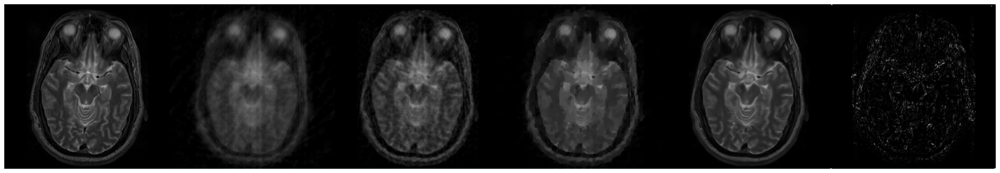

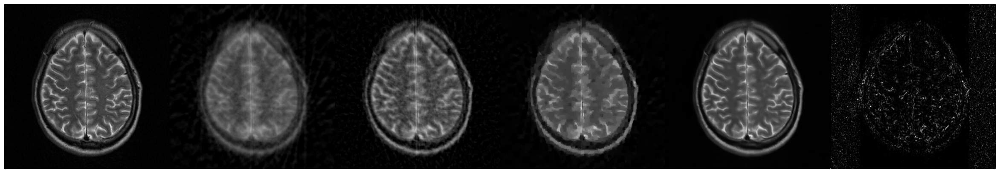

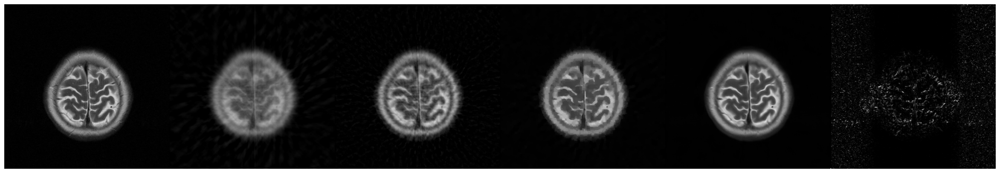

In [227]:
print(rec_imgs.shape, input_imgs.shape, orig_imgs.shape)
from torch.nn.functional import normalize
for i in range(rec_imgs.shape[0]):
    imgs = torch.cat((orig_imgs[i,...].squeeze(), #original
                      input_imgs[i,0,...].squeeze(), #L2 rec
                      input_imgs[i,1,...].squeeze(), #L1 rec
                      input_imgs[i,2,...].squeeze(), #TV rec
                      rec_imgs[i,...].squeeze(), #Unet rec
                      normalize(torch.square(orig_imgs[i,...]-rec_imgs[i,...])).squeeze()
                      ), 1)
    plt.figure(figsize=(30,6))
    plt.imshow(imgs,cmap='gray')
    plt.axis('off')

cpu
['L2', 'L1', 'TV', 'L2_L1', 'L2_TV', 'L1_TV', 'L2_L1_TV']

Rectype:  L2
saved_models/Unet_20lines_L2
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([4, 1, 256, 256]) torch.Size([4, 1, 256, 256])
torch.Size([1, 1, 256, 256]) torch.Size([1, 1, 256, 256])

Rectype:  L1
saved_models/Unet_20lines_L1
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([4, 1, 256, 256]) torch.Size([4, 1, 256, 256])
torch.Size([1, 1, 256, 256]) torch.Size([1, 1, 256, 256])

Rectype:  TV
saved_models/Unet_20lines_TV
torch.Size([1, 256, 256])
torch.Size([1, 256, 256])
torch.Size([4, 1, 256, 256]) torch.Size([4, 1, 256, 256])
torch.Size([1, 1, 256, 256]) torch.Size([1, 1, 256, 256])

Rectype:  L2_L1
saved_models/Unet_20lines_L2_L1
torch.Size([1, 256, 256])
torch.Size([2, 256, 256])
torch.Size([4, 1, 256, 256]) torch.Size([4, 2, 256, 256])
torch.Size([1, 1, 256, 256]) torch.Size([1, 2, 256, 256])

Rectype:  L2_TV
saved_models/Unet_20lines_L2_TV
torch.Size([1, 256, 256])
torch.Size([2

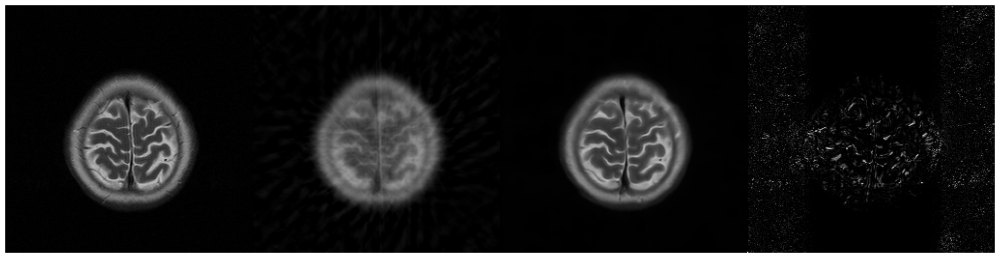

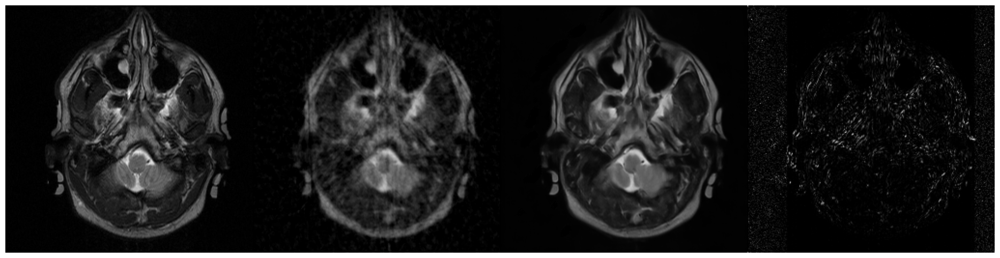

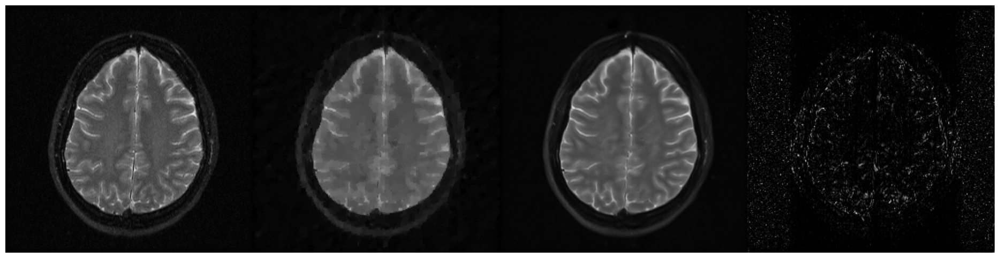

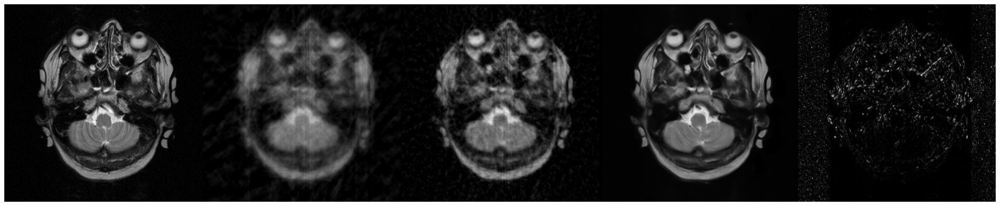

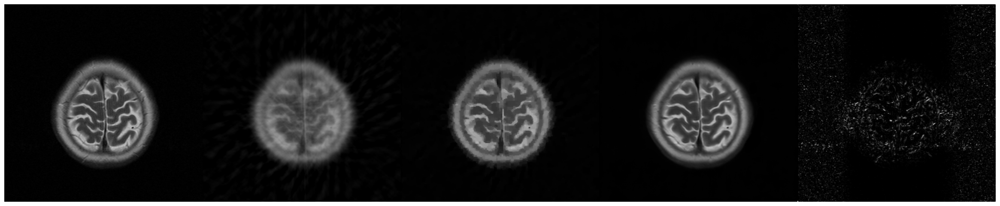

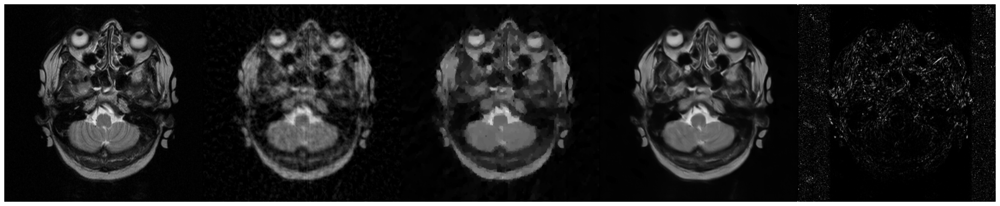

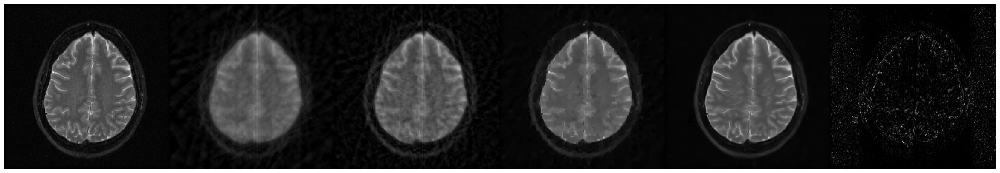

In [229]:
print(device)
model_name='Unet'
rad_lines=20
print(rectype_strings)
for rectype in rectype_strings:
    print()
    print('Rectype: ',rectype)    
    model, epoch, train_loss, val_loss = load_model(model_name=model_name, radial_lines=rad_lines, rectype=rectype, device=device, plot=False)
    dataloader=get_dataloader(rad_lines=rad_lines, rectype=rectype, num_imgs=5)
    img_idx=4
    rec_imgs, input_imgs, orig_imgs, val_loss=test_dataloader(model, device, dataloader, loss_fn = torch.nn.MSELoss())
    args=[orig_imgs[img_idx,...].squeeze()] + \
         [input_imgs[img_idx,i,...].squeeze() for i in range(input_imgs.shape[1])] + \
         [rec_imgs[img_idx,...].squeeze()] + \
         [normalize(torch.square(orig_imgs[img_idx,...]-rec_imgs[img_idx,...])).squeeze()]
                      
    imgs = torch.cat(args, 1)
    plt.figure(figsize=(30,6))
    plt.imshow(imgs,cmap='gray')
    plt.axis('off')
    